In [1]:
# Install package requirements
import sys
!{sys.executable} -m pip install numpy matplotlib ffmpeg deap
!conda install --yes --prefix {sys.prefix} -c conda-forge ffmpeg

Solving environment: done

# All requested packages already installed.



The score for this run: -0.04615437859476973


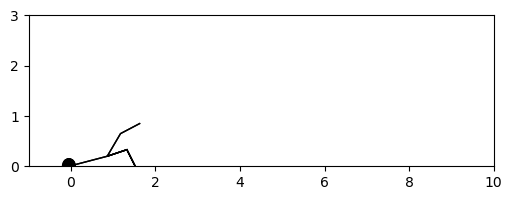

In [7]:
from utils import sim, animate
# sim() is a black-box function that we are trying to optimize
# sim() takes a length 40 vector (plan) as input, 
# and outputs a score and a vector that can be used to visualize the plan using animate()
# Our goal is to find the plan that maximizes the score without any knowledge of the sim function

# Let's try a random vector to see how this works
# FYI: the values in plan should be in the range [-1.0, 1.0]
import random

PLAN_LENGTH = 40
plan = [random.uniform(-1,1) for i in range(PLAN_LENGTH)]
score, vis = sim(plan)
print("The score for this run: {0}".format(score))

# Visualize the animation
import matplotlib.pyplot as plt
import matplotlib.animation
plt.rcParams["animation.html"] = "jshtml"

animate(vis)

In [37]:
import numpy as np
from deap import base
from deap import creator
from deap import tools

# DEAP tutorial here: https://deap.readthedocs.io/en/0.9.2/tutorials/next_step.html

# Placeholder for the fitness function we will maximize. Since single objective, set weights = 1 (-1 if want to minimize)
creator.create("FitnessMax", base.Fitness, weights=(1.0,))
# Placeholder for the individuals in the population, specify that they will maximize this fitness function
creator.create("Individual", list, fitness=creator.FitnessMax)

toolbox = base.Toolbox()
# Each float value in the plan vector is generated randomly between [-1, 1]
toolbox.register("param", lambda: random.uniform(-1, 1))
# Construct an individual by repeating param 40 times (length of the plan)
toolbox.register("individual", tools.initRepeat, creator.Individual, toolbox.param, n=PLAN_LENGTH)
# Construct a population by creating multiple individiuals
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

# Evaluation function must return a tuple of scores, even if single objective (DEAP limitation)
def evaluate(individual):
    # Run the blackbox simulation function
    score, vis = sim(individual)
    return (score, )

# Evolutionary operators:
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3) # keep top 3 at each iteration
toolbox.register("evaluate", evaluate)

# Use Statistics object to keep track of generation statistics
stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("std", np.std)
stats.register("min", np.min)
stats.register("max", np.max)

# Use HallOfFame to keep track of the best scores
hof = tools.HallOfFame(100)

In [39]:
from deap import algorithms

pop = toolbox.population(n=100)
final = algorithms.eaSimple(pop, toolbox, cxpb=0.5, mutpb=0.2, ngen=50, stats=stats, halloffame=hof)

gen	nevals	avg      	std   	min     	max    
0  	100   	-0.176768	1.0294	-2.50632	3.12056
1  	52    	0.671622 	0.92391	-1.51572	3.12056
2  	65    	1.15163  	0.851055	-1.10252	3.19137
3  	64    	1.45977  	0.80556 	-1.6779 	3.25482
4  	43    	1.61987  	0.831984	-2.22986	3.25482
5  	61    	1.96585  	0.882609	-1.39495	4.44432
6  	57    	2.01215  	1.07376 	-1.23036	3.4142 
7  	59    	2.0617   	1.17524 	-1.58014	3.51531
8  	61    	2.25177  	1.11025 	-1.20263	3.98992
9  	64    	2.57354  	1.21637 	-1.50772	5.00179
10 	48    	2.67676  	1.37608 	-1.15398	4.89612
11 	61    	2.70104  	1.54913 	-0.396837	4.89612
12 	49    	3.13007  	1.67083 	-2.55776 	5.13239
13 	63    	3.11442  	1.87278 	-0.641242	5.58981
14 	54    	4.02888  	1.35434 	-0.678214	5.53458
15 	44    	4.4289   	1.23088 	-0.988819	5.53458
16 	58    	4.21685  	1.58228 	-0.616878	5.53458
17 	62    	3.98158  	1.88635 	-0.940063	5.53458
18 	60    	3.93402  	1.99827 	-2.02697 	5.53458
19 	77    	3.84506  	2.01609 	-0.971451	5.5382 
20 	60   

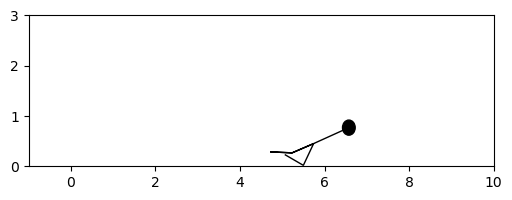

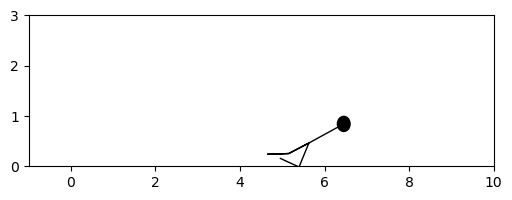

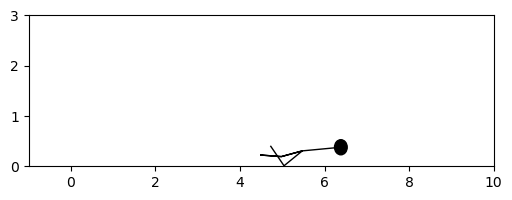

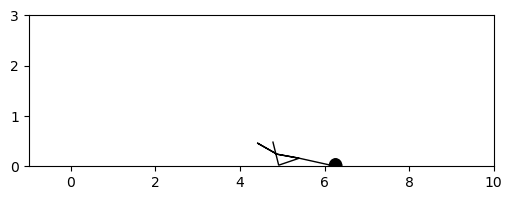

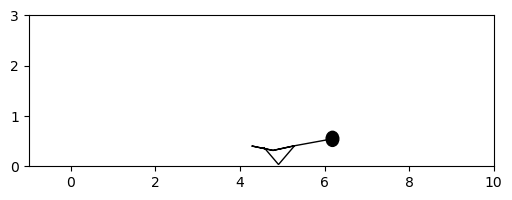

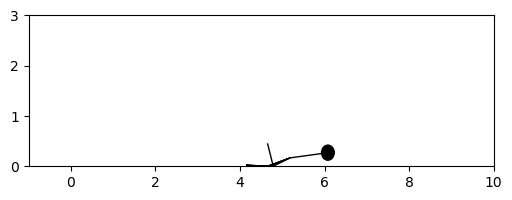

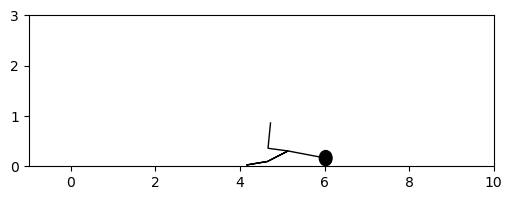

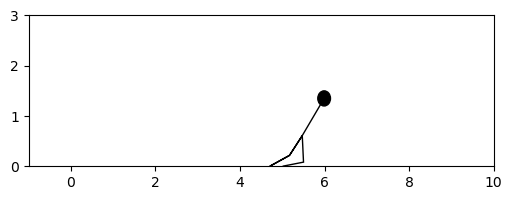

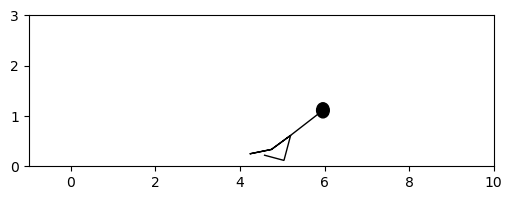

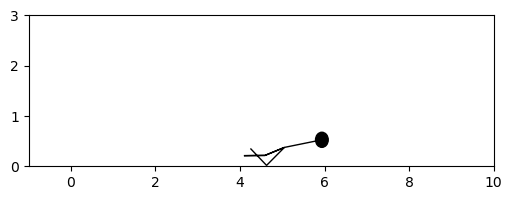

In [45]:
from IPython.display import display, HTML

for i in range(0, 100, 10):
    score, vis = sim(hof[i])
    display(HTML(animate(vis).to_jshtml()))